### 초기 경로 설정 (클래스 이용을 위함)

In [1]:
%cd /project/segmentation/smcho1201/segmentation_project

/project/segmentation/smcho1201/segmentation_project


In [2]:
# files and system
import os
import sys
import time
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from IPython.display import clear_output
# working with images
import cv2
import imageio
import scipy.ndimage
# import skimage.transform

import torchvision.transforms as transforms

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F


import torchsummary
from tqdm import notebook

sys.path.insert(0, '..')

# losses
from utils.metrics import iou_pytorch_eval, IoULoss, IoUBCELoss, DiceBCELoss , dice_pytorch_eval
from utils.metrics import iou_pytorch_test, dice_pytorch_test, precision_pytorch_test, recall_pytorch_test, fbeta_pytorch_test, accuracy_pytorch_test

# dataset
from utils.dataset import myDataSet

## 랜덤성을 배제한 환경 고정

In [3]:
random_seed= 42
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True

In [4]:
DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu") # select device for training, i.e. gpu or cpu
print(DEVICE)

cuda:1


# 1. Image augentation
> 실험할 때는 아예 augmentation도 고정시켜서 저장한 이미지를 사용해야 함.

In [5]:
_size = 224, 224
resize = transforms.Resize(_size, interpolation=0)

# set your transforms 
train_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                           transforms.RandomRotation(180),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(_size, padding = 10), # needed after rotation (with original size)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                       ])

/home/smcho1201/.conda/envs/pytorch/lib/python3.9/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


# 2. 데이터셋 클래스 생성
> 해당 클래스는 이용하려는 이미지와 라벨의 모든 경로(/data/segmentation/...)의 리스트를 인자로 받는다.   

In [6]:
train_images = glob.glob('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/*')
train_labels = glob.glob('/data/segmentation/segmentation/Kvasir-SEG/trainset/labels/*')
train_images = [img for img in train_images if img.find('jpg')!= -1] # super pixels 이미지 제외

valid_images = glob.glob('/data/segmentation/segmentation/Kvasir-SEG/validationset/images/*')
valid_labels = glob.glob('/data/segmentation/segmentation/Kvasir-SEG/validationset/labels/*')
valid_images = [img for img in valid_images if img.find('jpg')!= -1] # super pixels 이미지 제외


train_images = sorted(train_images)
train_labels = sorted(train_labels)

valid_images = sorted(valid_images)
valid_labels = sorted(valid_labels)


custom_dataset_train = myDataSet(train_images, train_labels, transforms=test_transforms)
print("My custom training-dataset has {} elements".format(len(custom_dataset_train)))


custom_dataset_val = myDataSet(valid_images, valid_labels, transforms=test_transforms)
print("My custom valing-dataset has {} elements".format(len(custom_dataset_val)))

My custom training-dataset has 600 elements
My custom valing-dataset has 200 elements


### dataset class check
> RGB 채널 평균 값이라 색 바뀜

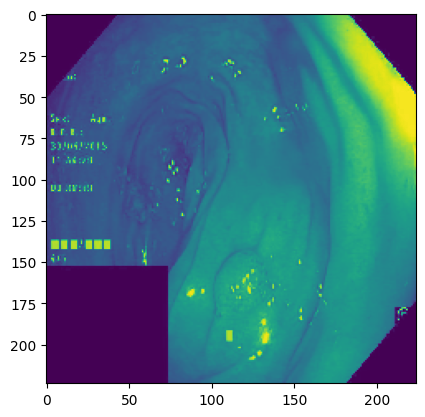

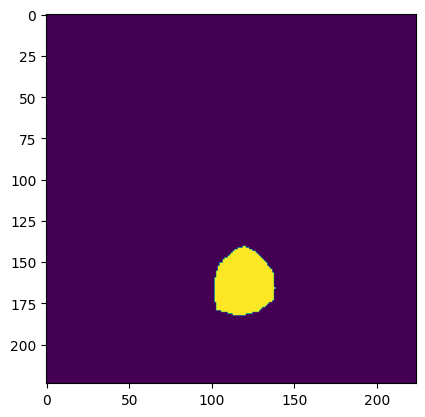

3픽셀의 평균값이라 색깔이 변경됨.


In [7]:
# Show example images.
image_number = 23
img, mask = custom_dataset_train.__getitem__(image_number)

# image
plt.figure()
plt.imshow(img.mean(0)) # 3 channels, take mean

# mask
plt.figure()
plt.imshow(mask[0, :, :]) # 1 channel, take it

plt.show()
print('3픽셀의 평균값이라 색깔이 변경됨.')

# 3. 모델 클래스 생성

In [5]:
# Begin training
from models.pop_medical_seg_models.unet import UNet

model = UNet(channel_in=3, channel_out=1)
model = model.to(DEVICE) # load model to DEVICE

# 4. 하이퍼 파라미터 세팅 & 데이터 로더 생성

In [9]:
# Define variables for the training
epochs = 100
patience = 20
BATCH_SIZE = 8

dataloader_train = torch.utils.data.DataLoader(custom_dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
dataloader_val = torch.utils.data.DataLoader(custom_dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [10]:
# Define optimiser and criterion for the training. You can try different ones to see which works best for your data and task
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8)

criterion = DiceBCELoss()
model_name = 'Unet'
data_name = 'Kvasir'

# 5. Training

 Epoch: 1 of 100, Iter.: 75 of 75, Train Loss: 1.142953, IoU: 0.314037, Dice: 0.439057
 Epoch: 1 of 100, Iter.: 75 of 75, Valid Loss: 1.031560, IoU: 0.385651, Dice: 0.506192

시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.


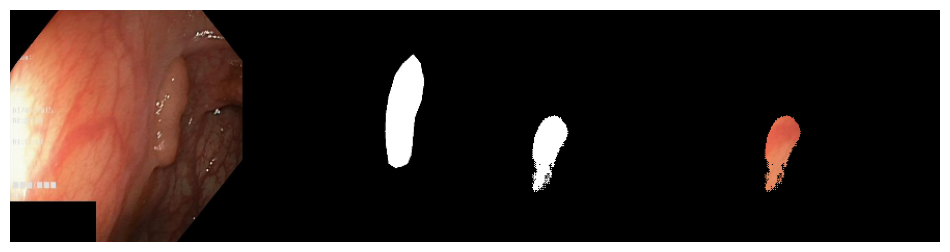

 Epoch: 2 of 100, Iter.: 75 of 75, Train Loss: 0.970027, IoU: 0.395956, Dice: 0.527587
 Epoch: 2 of 100, Iter.: 75 of 75, Valid Loss: 0.952797, IoU: 0.428259, Dice: 0.548431


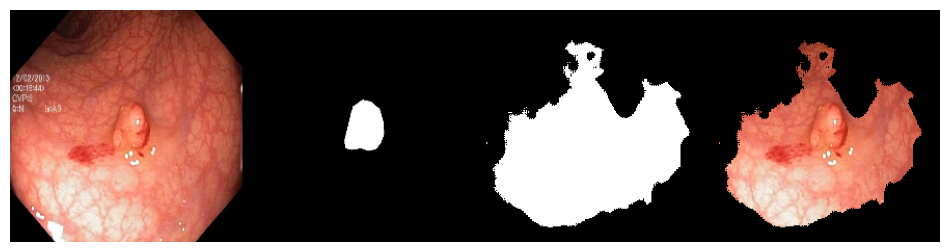

 Epoch: 3 of 100, Iter.: 75 of 75, Train Loss: 0.885186, IoU: 0.430171, Dice: 0.554446
 Epoch: 3 of 100, Iter.: 75 of 75, Valid Loss: 0.929381, IoU: 0.446378, Dice: 0.571895


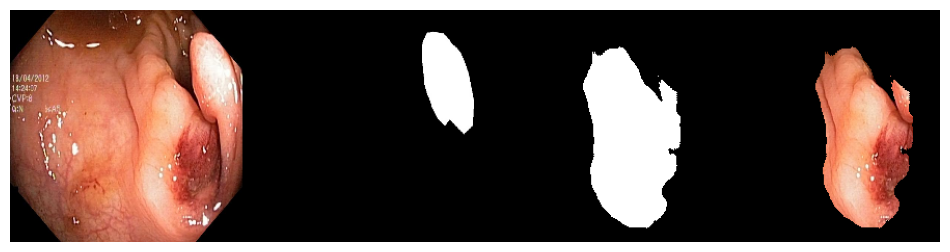

 Epoch: 4 of 100, Iter.: 75 of 75, Train Loss: 0.829567, IoU: 0.453426, Dice: 0.578136
 Epoch: 4 of 100, Iter.: 75 of 75, Valid Loss: 0.815872, IoU: 0.467323, Dice: 0.588736


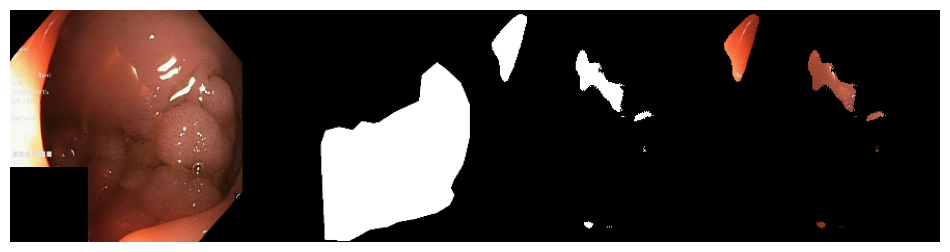

 Epoch: 5 of 100, Iter.: 75 of 75, Train Loss: 0.760801, IoU: 0.476123, Dice: 0.594141
 Epoch: 5 of 100, Iter.: 75 of 75, Valid Loss: 0.782666, IoU: 0.424526, Dice: 0.526440


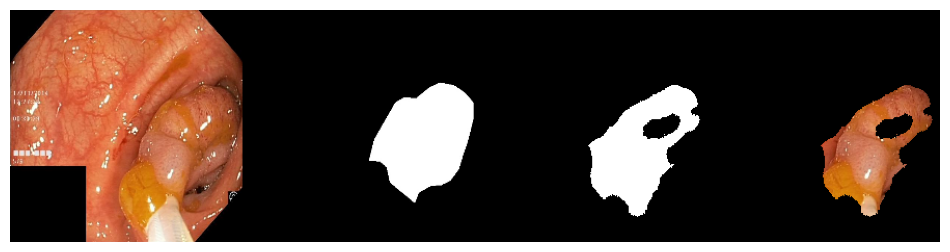

 Epoch: 6 of 100, Iter.: 75 of 75, Train Loss: 0.699980, IoU: 0.503976, Dice: 0.620194
 Epoch: 6 of 100, Iter.: 75 of 75, Valid Loss: 0.724698, IoU: 0.498773, Dice: 0.613188


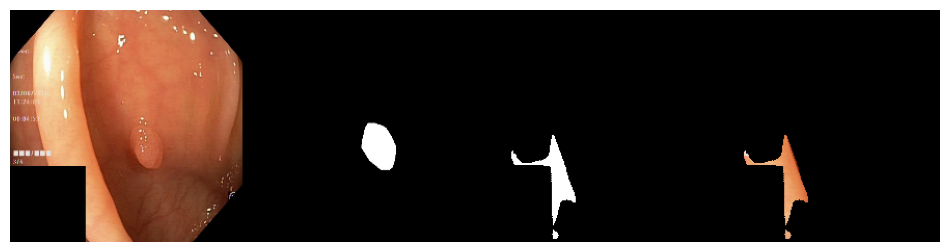

 Epoch: 7 of 100, Iter.: 75 of 75, Train Loss: 0.664929, IoU: 0.534878, Dice: 0.652596
 Epoch: 7 of 100, Iter.: 75 of 75, Valid Loss: 0.722562, IoU: 0.528546, Dice: 0.645124


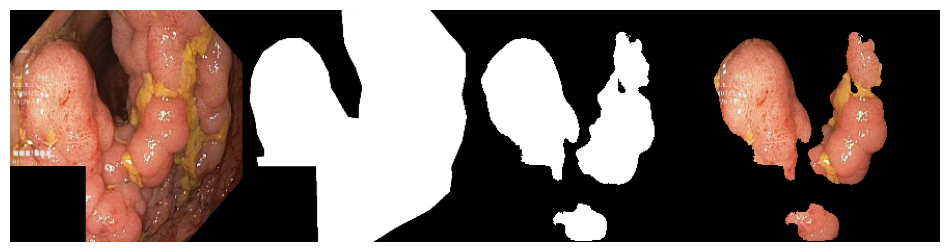

 Epoch: 8 of 100, Iter.: 75 of 75, Train Loss: 0.625253, IoU: 0.554106, Dice: 0.670496
 Epoch: 8 of 100, Iter.: 75 of 75, Valid Loss: 0.669517, IoU: 0.548411, Dice: 0.656673


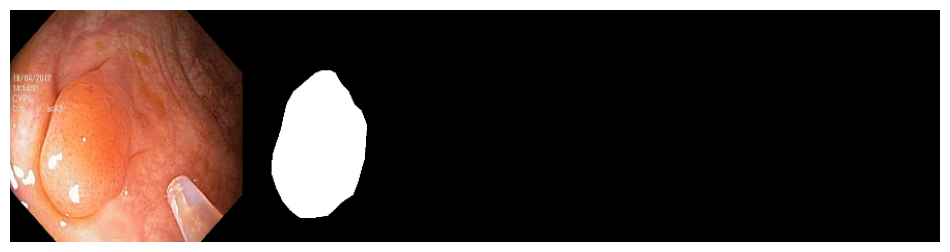

 Epoch: 9 of 100, Iter.: 75 of 75, Train Loss: 0.564154, IoU: 0.604395, Dice: 0.715706
 Epoch: 9 of 100, Iter.: 75 of 75, Valid Loss: 0.646346, IoU: 0.552248, Dice: 0.668114


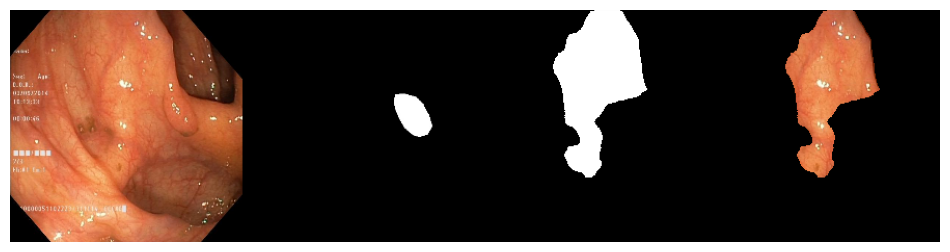

 Epoch: 10 of 100, Iter.: 75 of 75, Train Loss: 0.528590, IoU: 0.623314, Dice: 0.731460
 Epoch: 10 of 100, Iter.: 75 of 75, Valid Loss: 0.596689, IoU: 0.585213, Dice: 0.690882


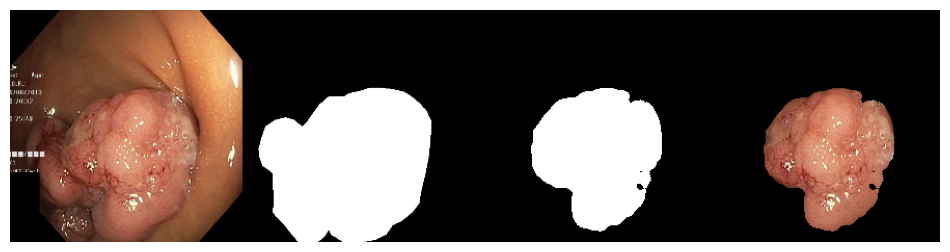

 Epoch: 11 of 100, Iter.: 75 of 75, Train Loss: 0.461249, IoU: 0.665483, Dice: 0.767361
 Epoch: 11 of 100, Iter.: 75 of 75, Valid Loss: 0.885416, IoU: 0.388680, Dice: 0.459838


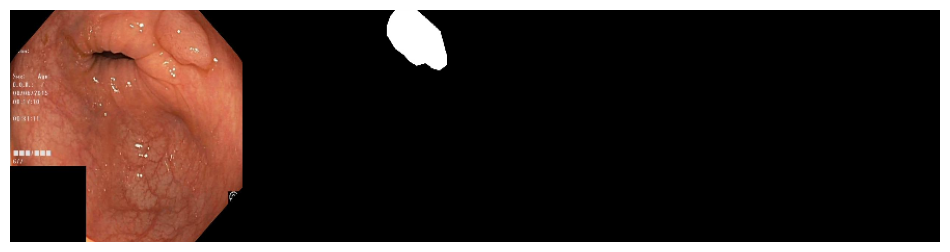

 Epoch: 12 of 100, Iter.: 75 of 75, Train Loss: 0.426158, IoU: 0.687284, Dice: 0.784786
 Epoch: 12 of 100, Iter.: 75 of 75, Valid Loss: 0.573601, IoU: 0.599819, Dice: 0.704664


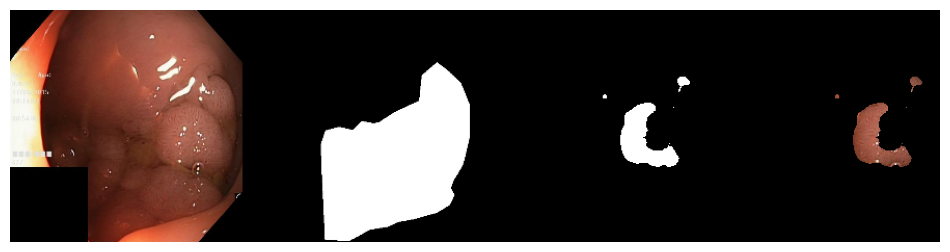

 Epoch: 13 of 100, Iter.: 75 of 75, Train Loss: 0.412152, IoU: 0.693584, Dice: 0.789953
 Epoch: 13 of 100, Iter.: 75 of 75, Valid Loss: 0.615778, IoU: 0.573827, Dice: 0.663826


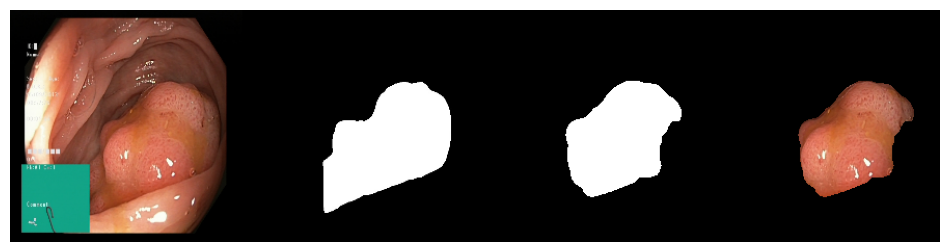

 Epoch: 14 of 100, Iter.: 75 of 75, Train Loss: 0.374751, IoU: 0.717816, Dice: 0.809983
 Epoch: 14 of 100, Iter.: 75 of 75, Valid Loss: 0.537995, IoU: 0.641285, Dice: 0.741515


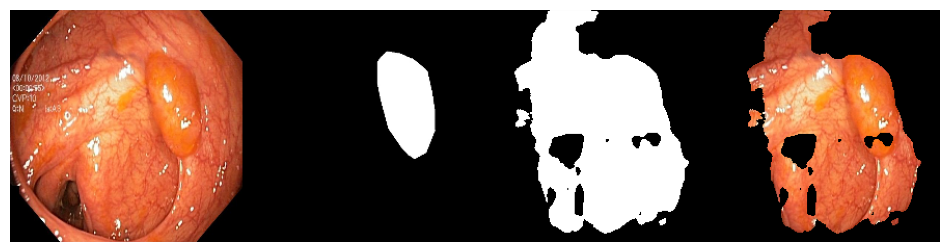

 Epoch: 15 of 100, Iter.: 75 of 75, Train Loss: 0.336504, IoU: 0.741112, Dice: 0.827846
 Epoch: 15 of 100, Iter.: 75 of 75, Valid Loss: 0.632393, IoU: 0.571876, Dice: 0.667899


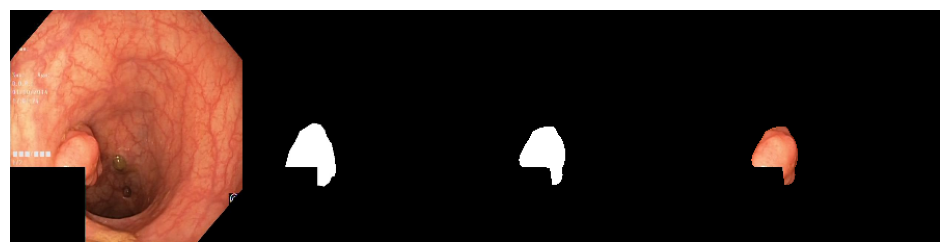

 Epoch: 16 of 100, Iter.: 75 of 75, Train Loss: 0.323419, IoU: 0.748954, Dice: 0.835806
 Epoch: 16 of 100, Iter.: 75 of 75, Valid Loss: 0.577563, IoU: 0.592555, Dice: 0.696504


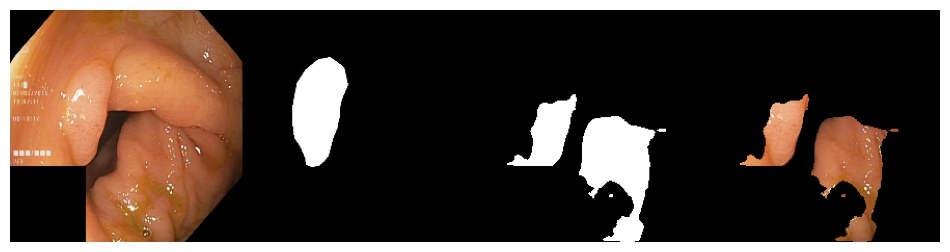

 Epoch: 17 of 100, Iter.: 75 of 75, Train Loss: 0.293834, IoU: 0.768440, Dice: 0.849962
 Epoch: 17 of 100, Iter.: 75 of 75, Valid Loss: 0.522198, IoU: 0.651558, Dice: 0.747775


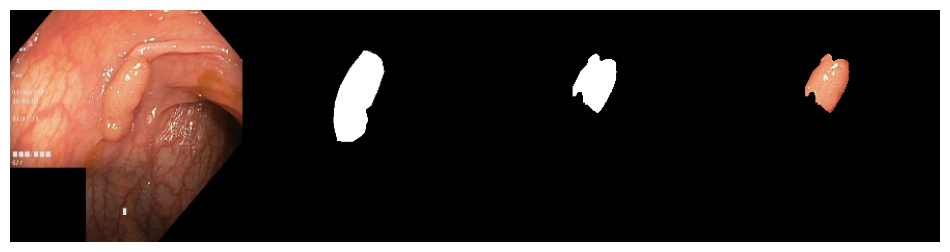

 Epoch: 18 of 100, Iter.: 75 of 75, Train Loss: 0.252145, IoU: 0.794728, Dice: 0.867349
 Epoch: 18 of 100, Iter.: 75 of 75, Valid Loss: 0.516201, IoU: 0.664661, Dice: 0.762175


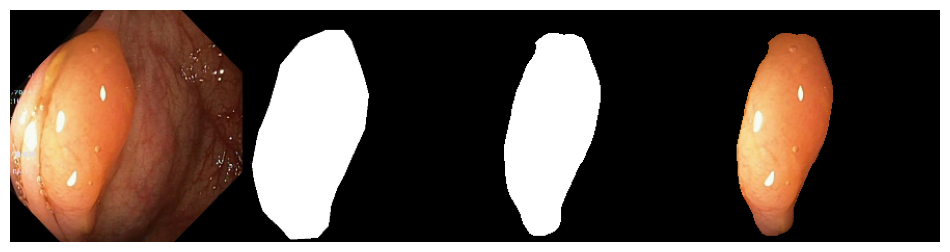

 Epoch: 19 of 100, Iter.: 75 of 75, Train Loss: 0.250358, IoU: 0.796371, Dice: 0.868883
 Epoch: 19 of 100, Iter.: 75 of 75, Valid Loss: 0.549544, IoU: 0.626373, Dice: 0.730647


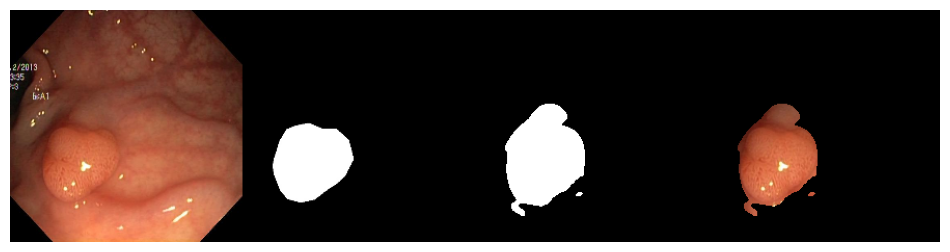

 Epoch: 20 of 100, Iter.: 75 of 75, Train Loss: 0.256275, IoU: 0.795726, Dice: 0.869577
 Epoch: 20 of 100, Iter.: 75 of 75, Valid Loss: 0.727299, IoU: 0.541824, Dice: 0.661947


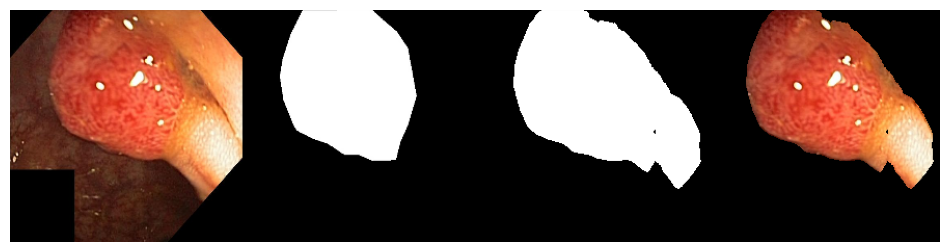

 Epoch: 21 of 100, Iter.: 75 of 75, Train Loss: 0.209438, IoU: 0.824191, Dice: 0.891605
 Epoch: 21 of 100, Iter.: 75 of 75, Valid Loss: 0.568331, IoU: 0.624680, Dice: 0.716380


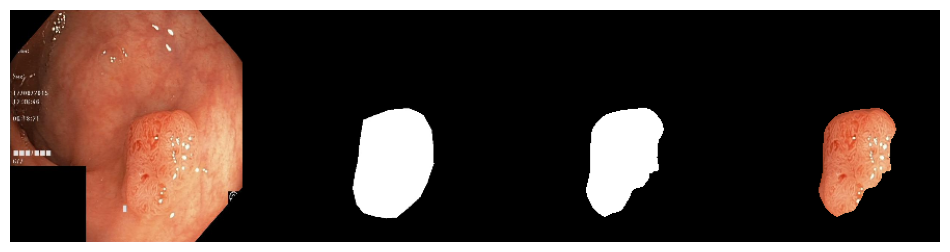

 Epoch: 22 of 100, Iter.: 75 of 75, Train Loss: 0.177201, IoU: 0.845543, Dice: 0.905100
 Epoch: 22 of 100, Iter.: 75 of 75, Valid Loss: 0.574343, IoU: 0.622962, Dice: 0.710956


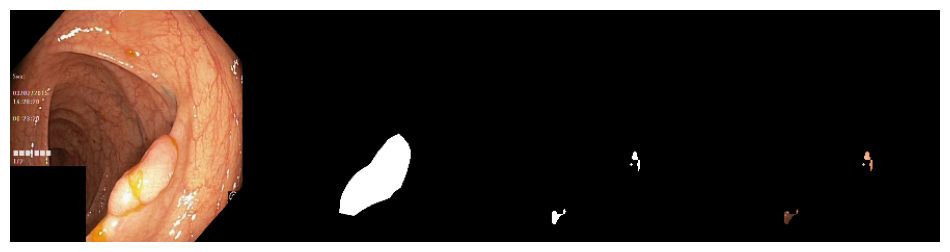

 Epoch: 23 of 100, Iter.: 75 of 75, Train Loss: 0.187422, IoU: 0.839379, Dice: 0.901231
 Epoch: 23 of 100, Iter.: 75 of 75, Valid Loss: 0.623717, IoU: 0.599928, Dice: 0.693012


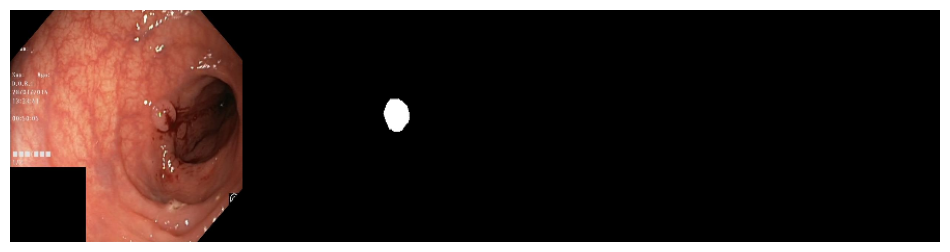

 Epoch: 24 of 100, Iter.: 75 of 75, Train Loss: 0.192176, IoU: 0.830163, Dice: 0.892354
 Epoch: 24 of 100, Iter.: 75 of 75, Valid Loss: 0.584691, IoU: 0.630972, Dice: 0.737316


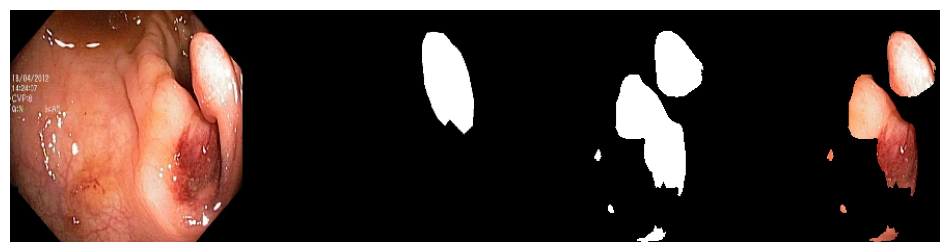

 Epoch: 25 of 100, Iter.: 75 of 75, Train Loss: 0.173606, IoU: 0.843043, Dice: 0.903217
 Epoch: 25 of 100, Iter.: 75 of 75, Valid Loss: 0.518263, IoU: 0.678913, Dice: 0.773717


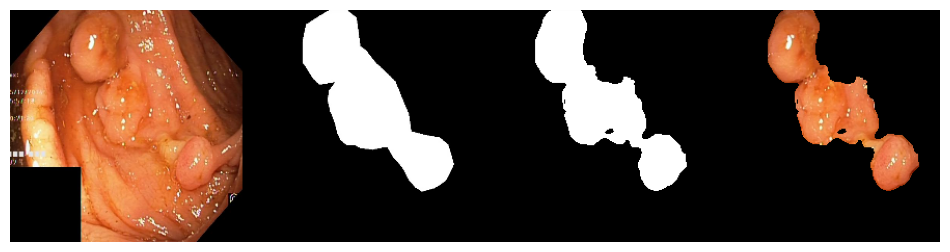

 Epoch: 26 of 100, Iter.: 75 of 75, Train Loss: 0.151546, IoU: 0.860220, Dice: 0.915686
 Epoch: 26 of 100, Iter.: 75 of 75, Valid Loss: 0.545014, IoU: 0.646574, Dice: 0.743500


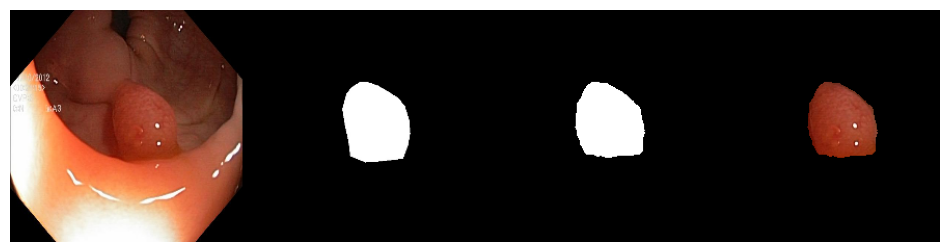

 Epoch: 27 of 100, Iter.: 75 of 75, Train Loss: 0.166961, IoU: 0.843262, Dice: 0.899936
 Epoch: 27 of 100, Iter.: 75 of 75, Valid Loss: 0.532318, IoU: 0.651472, Dice: 0.740689


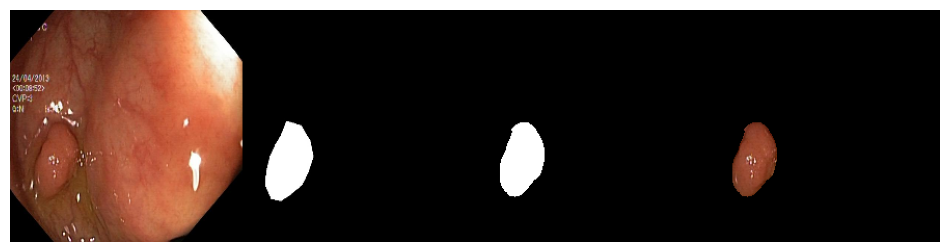

 Epoch: 28 of 100, Iter.: 75 of 75, Train Loss: 0.149921, IoU: 0.858658, Dice: 0.911465
 Epoch: 28 of 100, Iter.: 75 of 75, Valid Loss: 0.707757, IoU: 0.584819, Dice: 0.702752


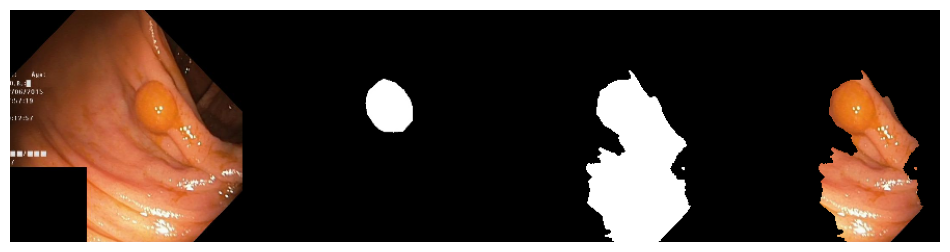

 Epoch: 29 of 100, Iter.: 75 of 75, Train Loss: 0.125883, IoU: 0.878443, Dice: 0.928413
 Epoch: 29 of 100, Iter.: 75 of 75, Valid Loss: 0.667021, IoU: 0.610184, Dice: 0.719211


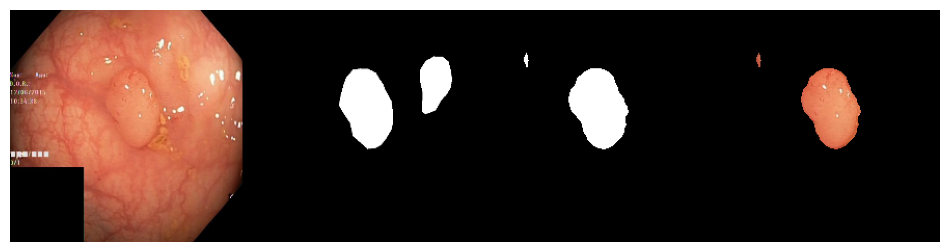

 Epoch: 30 of 100, Iter.: 75 of 75, Train Loss: 0.120854, IoU: 0.878819, Dice: 0.927751
 Epoch: 30 of 100, Iter.: 75 of 75, Valid Loss: 0.525933, IoU: 0.663105, Dice: 0.761195


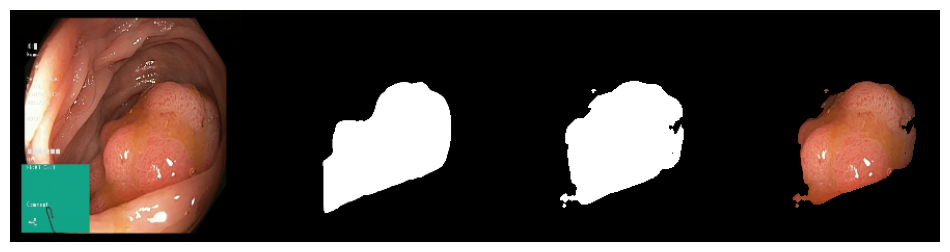

 Epoch: 31 of 100, Iter.: 75 of 75, Train Loss: 0.106322, IoU: 0.894181, Dice: 0.937843
 Epoch: 31 of 100, Iter.: 75 of 75, Valid Loss: 0.523196, IoU: 0.676425, Dice: 0.767381


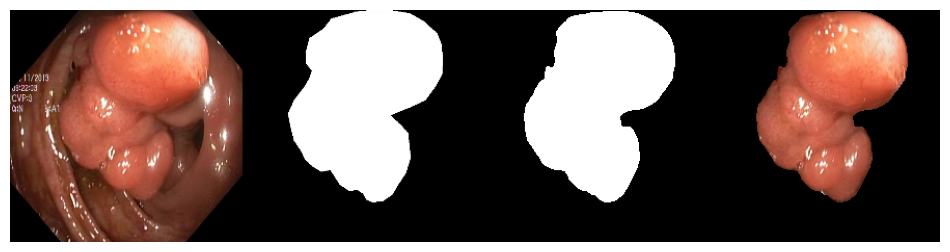

 Epoch: 32 of 100, Iter.: 75 of 75, Train Loss: 0.091364, IoU: 0.904218, Dice: 0.943298
 Epoch: 32 of 100, Iter.: 75 of 75, Valid Loss: 0.552311, IoU: 0.670611, Dice: 0.757723


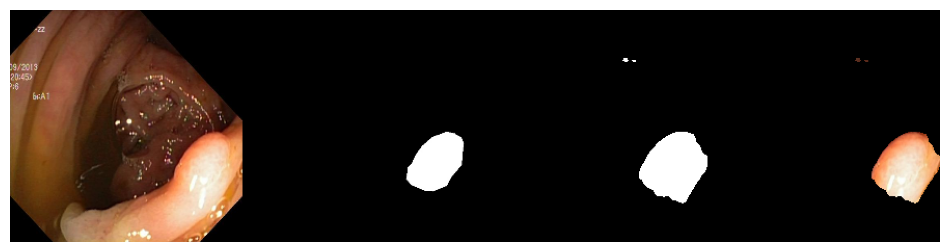

 Epoch: 33 of 100, Iter.: 75 of 75, Train Loss: 0.122799, IoU: 0.877984, Dice: 0.927614
 Epoch: 33 of 100, Iter.: 75 of 75, Valid Loss: 0.520307, IoU: 0.670729, Dice: 0.765211


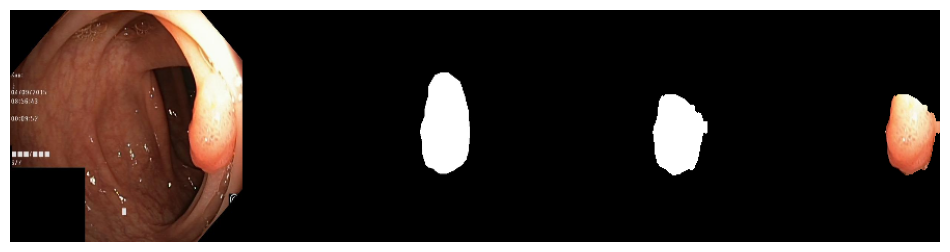

 Epoch: 34 of 100, Iter.: 75 of 75, Train Loss: 0.127363, IoU: 0.871966, Dice: 0.924660
 Epoch: 34 of 100, Iter.: 75 of 75, Valid Loss: 0.534580, IoU: 0.661923, Dice: 0.760256


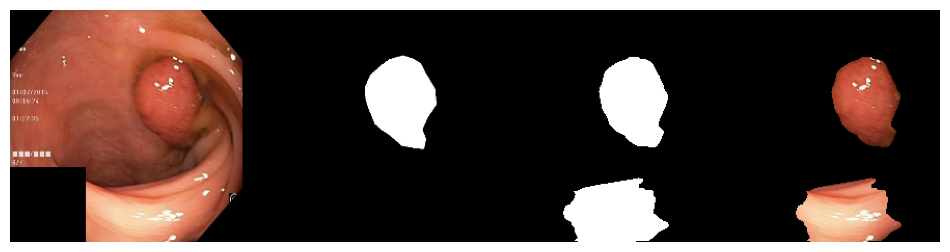

 Epoch: 35 of 100, Iter.: 75 of 75, Train Loss: 0.114318, IoU: 0.883902, Dice: 0.932534
 Epoch: 35 of 100, Iter.: 75 of 75, Valid Loss: 0.557784, IoU: 0.665039, Dice: 0.755647


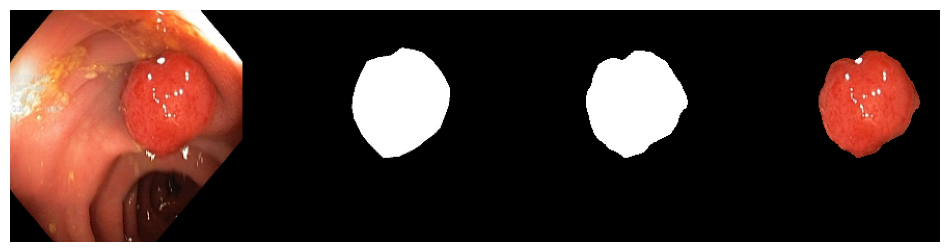

 Epoch: 36 of 100, Iter.: 75 of 75, Train Loss: 0.103493, IoU: 0.889906, Dice: 0.934853
 Epoch: 36 of 100, Iter.: 75 of 75, Valid Loss: 0.577221, IoU: 0.647641, Dice: 0.746137


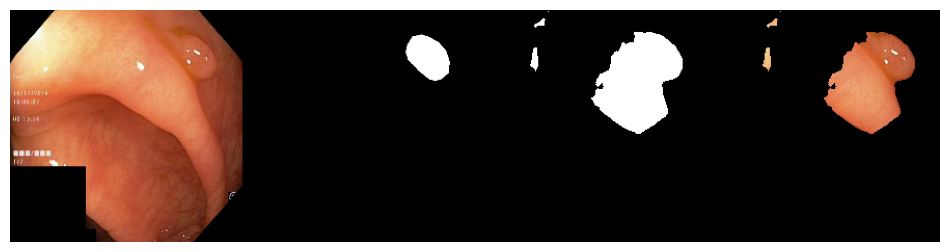

 Epoch: 37 of 100, Iter.: 75 of 75, Train Loss: 0.091846, IoU: 0.904466, Dice: 0.945849
 Epoch: 37 of 100, Iter.: 75 of 75, Valid Loss: 0.514981, IoU: 0.691733, Dice: 0.781936


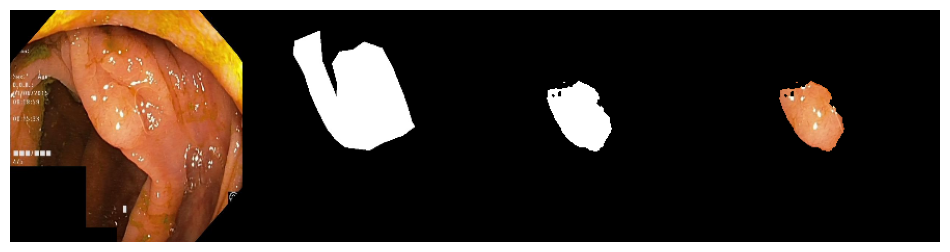

 Epoch: 38 of 100, Iter.: 75 of 75, Train Loss: 0.080550, IoU: 0.910674, Dice: 0.948261
 Epoch: 38 of 100, Iter.: 75 of 75, Valid Loss: 0.506427, IoU: 0.681570, Dice: 0.770014


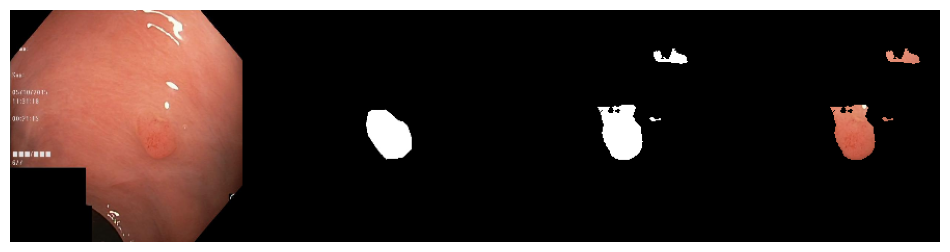

 Epoch: 39 of 100, Iter.: 75 of 75, Train Loss: 0.070111, IoU: 0.922602, Dice: 0.956602
 Epoch: 39 of 100, Iter.: 75 of 75, Valid Loss: 0.510852, IoU: 0.701768, Dice: 0.788938


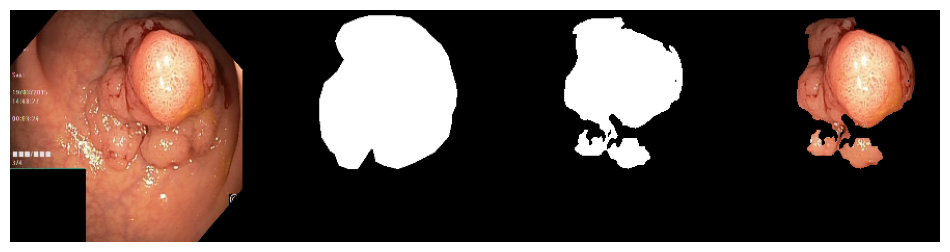

 Epoch: 40 of 100, Iter.: 75 of 75, Train Loss: 0.062689, IoU: 0.928703, Dice: 0.960231
 Epoch: 40 of 100, Iter.: 75 of 75, Valid Loss: 0.537190, IoU: 0.685047, Dice: 0.773581


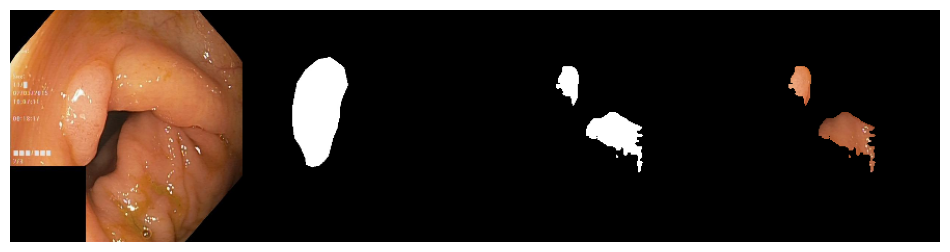

 Epoch: 41 of 100, Iter.: 75 of 75, Train Loss: 0.060573, IoU: 0.931435, Dice: 0.961895
 Epoch: 41 of 100, Iter.: 75 of 75, Valid Loss: 0.526364, IoU: 0.699316, Dice: 0.787052


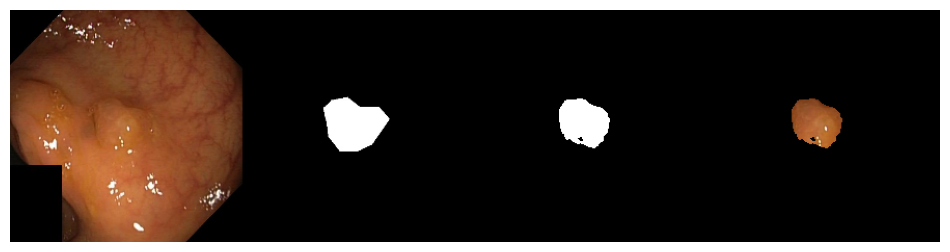

 Epoch: 42 of 100, Iter.: 75 of 75, Train Loss: 0.057560, IoU: 0.934730, Dice: 0.963753
 Epoch: 42 of 100, Iter.: 75 of 75, Valid Loss: 0.527733, IoU: 0.700035, Dice: 0.787645


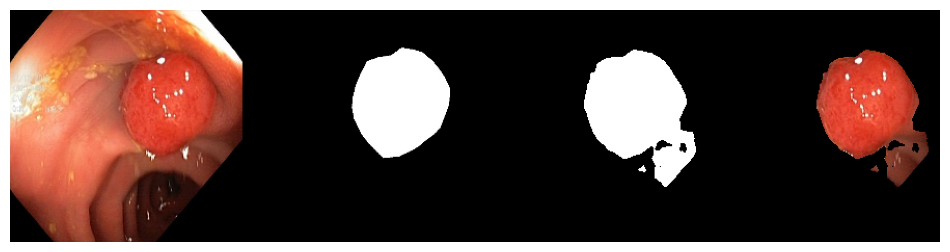

 Epoch: 43 of 100, Iter.: 75 of 75, Train Loss: 0.056441, IoU: 0.936123, Dice: 0.965028
 Epoch: 43 of 100, Iter.: 75 of 75, Valid Loss: 0.538006, IoU: 0.696986, Dice: 0.784649


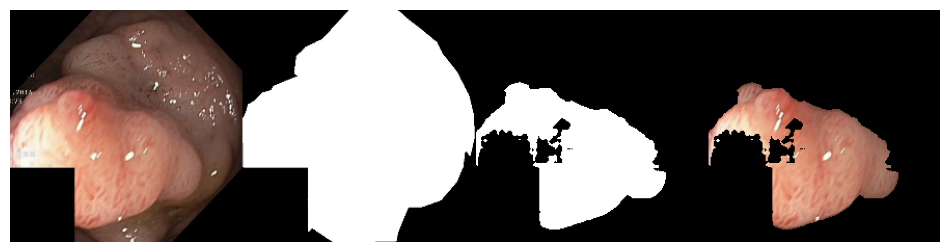

 Epoch: 44 of 100, Iter.: 75 of 75, Train Loss: 0.052211, IoU: 0.939769, Dice: 0.967228
 Epoch: 44 of 100, Iter.: 75 of 75, Valid Loss: 0.535762, IoU: 0.695363, Dice: 0.781822


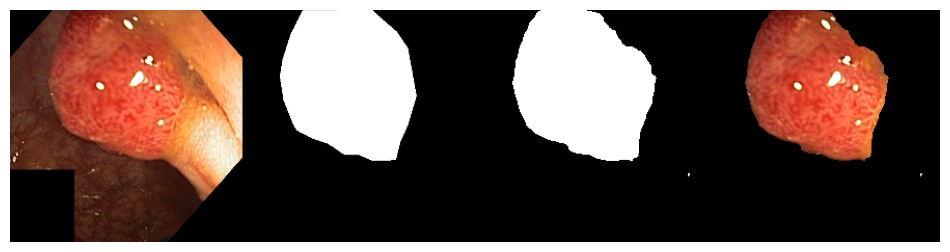

 Epoch: 45 of 100, Iter.: 75 of 75, Train Loss: 0.052037, IoU: 0.939815, Dice: 0.967199
 Epoch: 45 of 100, Iter.: 75 of 75, Valid Loss: 0.542718, IoU: 0.686677, Dice: 0.770770


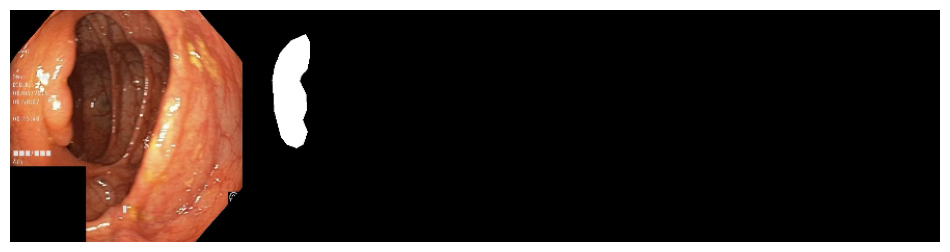

 Epoch: 46 of 100, Iter.: 75 of 75, Train Loss: 0.061523, IoU: 0.928691, Dice: 0.960735
 Epoch: 46 of 100, Iter.: 75 of 75, Valid Loss: 0.534473, IoU: 0.694044, Dice: 0.784642


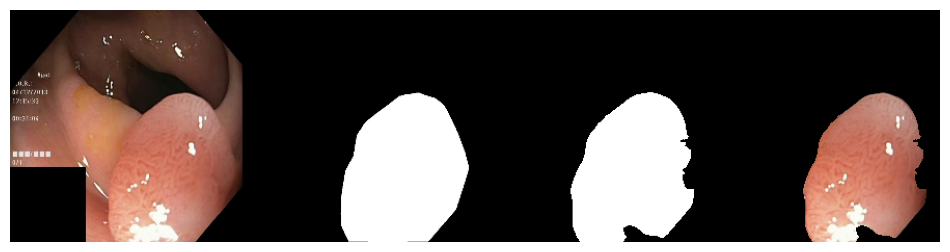

 Epoch: 47 of 100, Iter.: 75 of 75, Train Loss: 0.052154, IoU: 0.938832, Dice: 0.966768
 Epoch: 47 of 100, Iter.: 75 of 75, Valid Loss: 0.525974, IoU: 0.699717, Dice: 0.789775


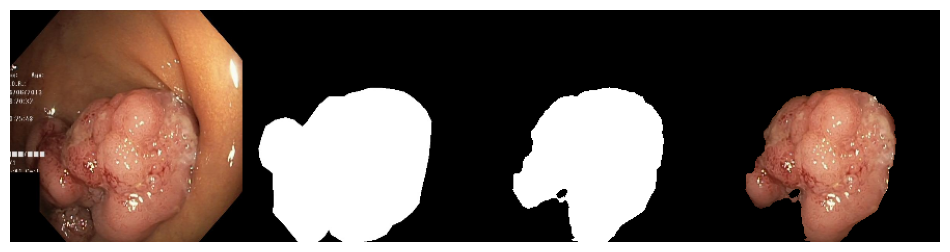

 Epoch: 48 of 100, Iter.: 75 of 75, Train Loss: 0.048590, IoU: 0.940911, Dice: 0.967009
 Epoch: 48 of 100, Iter.: 75 of 75, Valid Loss: 0.593862, IoU: 0.668427, Dice: 0.752852


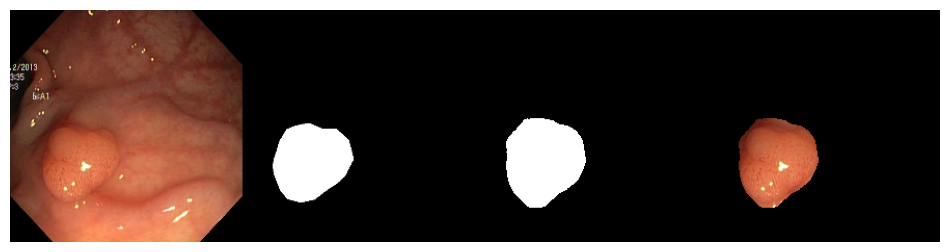

 Epoch: 49 of 100, Iter.: 75 of 75, Train Loss: 0.047251, IoU: 0.942001, Dice: 0.967388
 Epoch: 49 of 100, Iter.: 75 of 75, Valid Loss: 0.551364, IoU: 0.697137, Dice: 0.784094


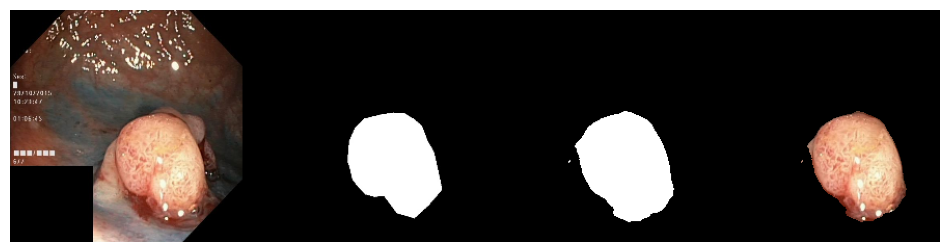

 Epoch: 50 of 100, Iter.: 75 of 75, Train Loss: 0.103791, IoU: 0.891748, Dice: 0.935047
 Epoch: 50 of 100, Iter.: 75 of 75, Valid Loss: 0.663932, IoU: 0.630093, Dice: 0.728228


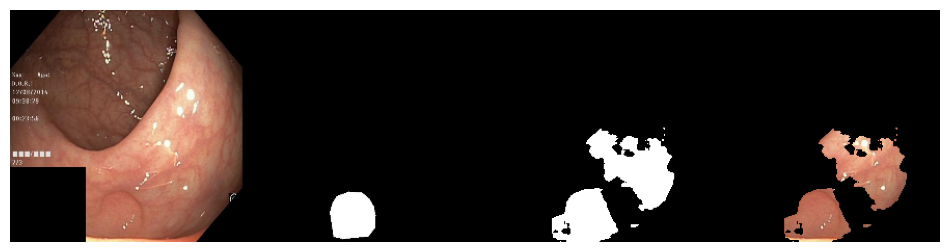

 Epoch: 51 of 100, Iter.: 75 of 75, Train Loss: 0.157676, IoU: 0.847162, Dice: 0.907101
 Epoch: 51 of 100, Iter.: 75 of 75, Valid Loss: 0.564523, IoU: 0.675450, Dice: 0.773644


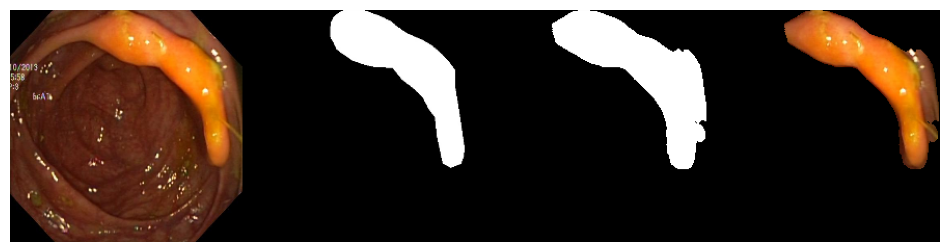

 Epoch: 52 of 100, Iter.: 75 of 75, Train Loss: 0.096050, IoU: 0.897340, Dice: 0.941148
 Epoch: 52 of 100, Iter.: 75 of 75, Valid Loss: 0.542824, IoU: 0.678870, Dice: 0.774213


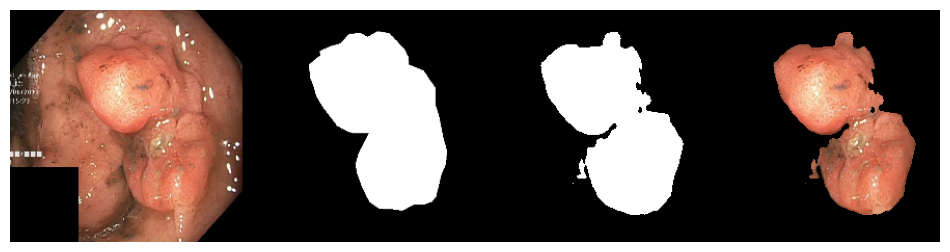

 Epoch: 53 of 100, Iter.: 75 of 75, Train Loss: 0.072418, IoU: 0.920541, Dice: 0.955660
 Epoch: 53 of 100, Iter.: 75 of 75, Valid Loss: 0.540742, IoU: 0.680267, Dice: 0.771472


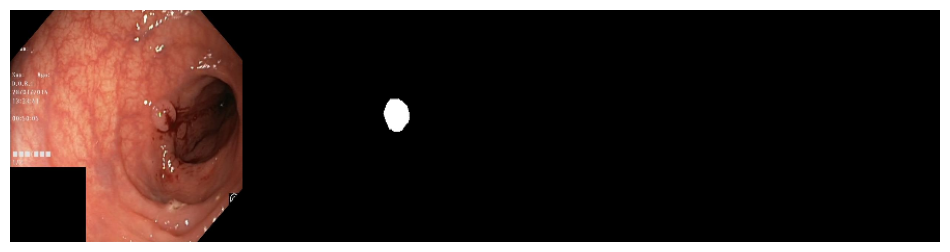

 Epoch: 54 of 100, Iter.: 75 of 75, Train Loss: 0.055528, IoU: 0.932158, Dice: 0.962057
 Epoch: 54 of 100, Iter.: 75 of 75, Valid Loss: 0.509177, IoU: 0.707987, Dice: 0.795021


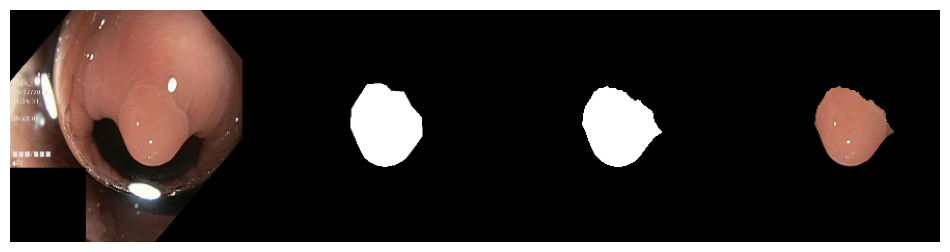

 Epoch: 55 of 100, Iter.: 75 of 75, Train Loss: 0.047053, IoU: 0.942275, Dice: 0.968537
 Epoch: 55 of 100, Iter.: 75 of 75, Valid Loss: 0.567102, IoU: 0.692435, Dice: 0.779998


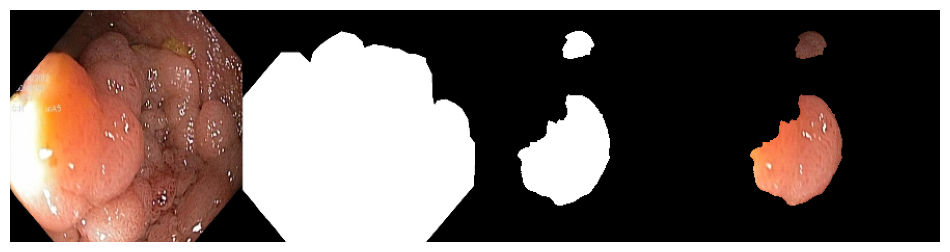

 Epoch: 56 of 100, Iter.: 75 of 75, Train Loss: 0.043055, IoU: 0.946160, Dice: 0.970595
 Epoch: 56 of 100, Iter.: 75 of 75, Valid Loss: 0.551751, IoU: 0.702352, Dice: 0.789717


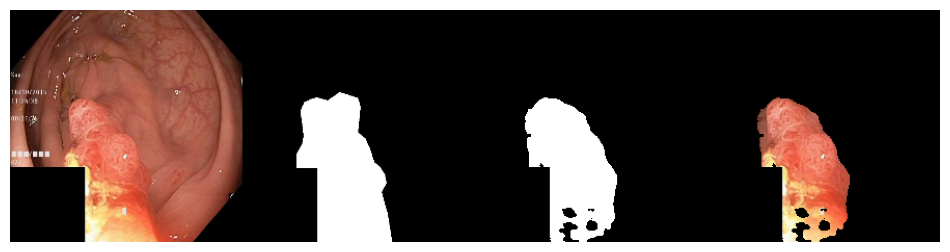

 Epoch: 57 of 100, Iter.: 75 of 75, Train Loss: 0.041083, IoU: 0.948489, Dice: 0.972801
 Epoch: 57 of 100, Iter.: 75 of 75, Valid Loss: 0.596961, IoU: 0.688499, Dice: 0.777811


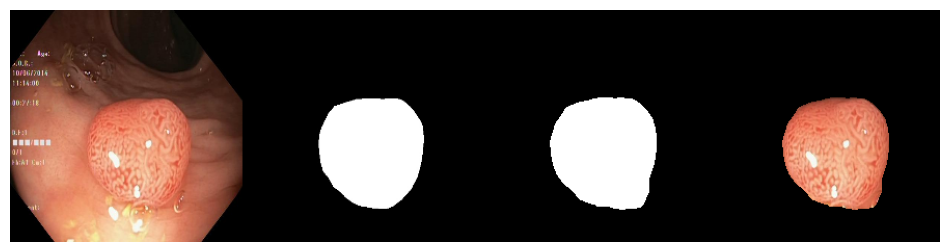

 Epoch: 58 of 100, Iter.: 75 of 75, Train Loss: 0.041555, IoU: 0.948656, Dice: 0.972251
 Epoch: 58 of 100, Iter.: 75 of 75, Valid Loss: 0.598675, IoU: 0.690405, Dice: 0.781889


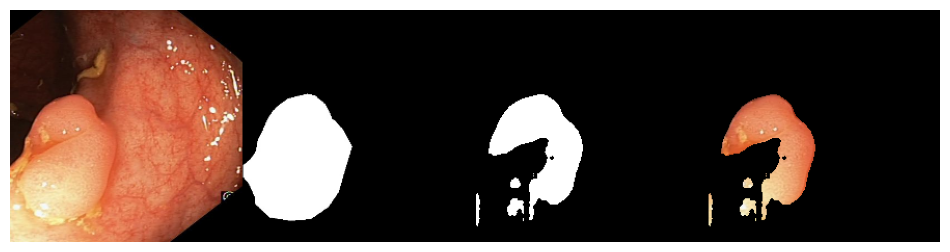

 Epoch: 59 of 100, Iter.: 75 of 75, Train Loss: 0.051453, IoU: 0.935083, Dice: 0.964189
 Epoch: 59 of 100, Iter.: 75 of 75, Valid Loss: 0.569440, IoU: 0.690933, Dice: 0.784697


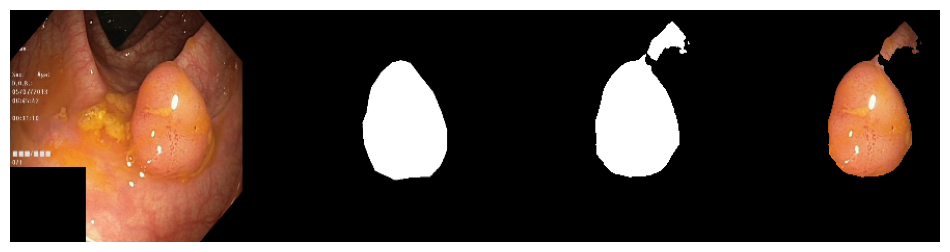

 Epoch: 60 of 100, Iter.: 75 of 75, Train Loss: 0.041953, IoU: 0.947541, Dice: 0.972324
 Epoch: 60 of 100, Iter.: 75 of 75, Valid Loss: 0.550334, IoU: 0.697900, Dice: 0.785628


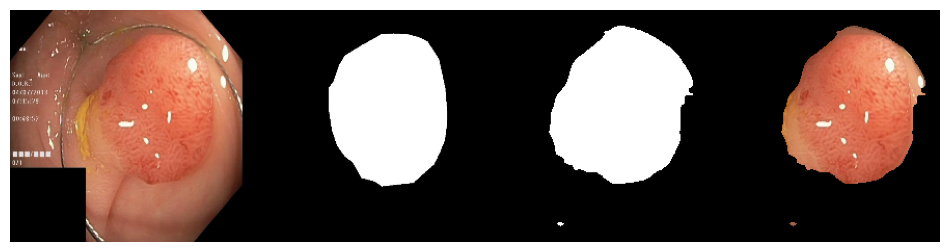

 Epoch: 61 of 100, Iter.: 75 of 75, Train Loss: 0.038503, IoU: 0.951410, Dice: 0.974601
 Epoch: 61 of 100, Iter.: 75 of 75, Valid Loss: 0.558277, IoU: 0.701249, Dice: 0.790510


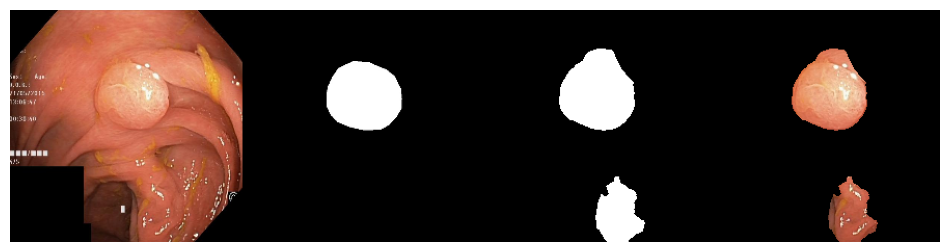

 Epoch: 62 of 100, Iter.: 75 of 75, Train Loss: 0.035783, IoU: 0.955234, Dice: 0.976538
 Epoch: 62 of 100, Iter.: 75 of 75, Valid Loss: 0.579125, IoU: 0.699265, Dice: 0.786594


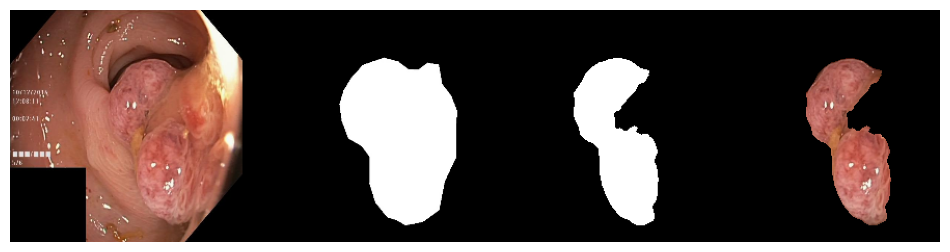

 Epoch: 63 of 100, Iter.: 75 of 75, Train Loss: 0.033622, IoU: 0.958117, Dice: 0.978327
 Epoch: 63 of 100, Iter.: 75 of 75, Valid Loss: 0.603015, IoU: 0.692368, Dice: 0.780889


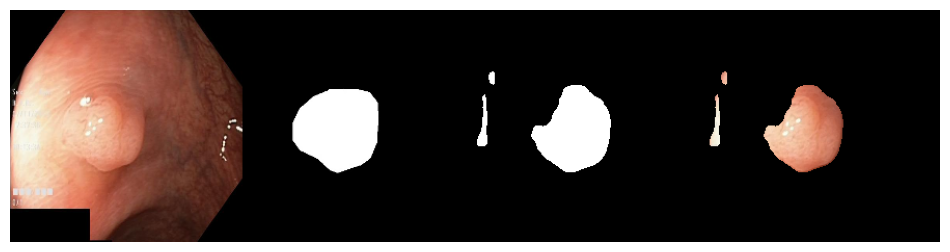

 Epoch: 64 of 100, Iter.: 75 of 75, Train Loss: 0.032781, IoU: 0.958652, Dice: 0.978427
 Epoch: 64 of 100, Iter.: 75 of 75, Valid Loss: 0.586496, IoU: 0.704872, Dice: 0.792232


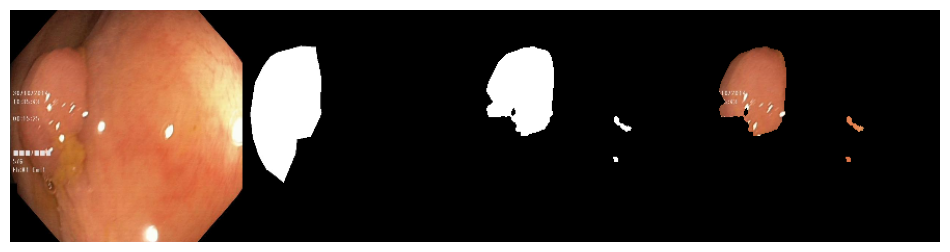

 Epoch: 65 of 100, Iter.: 75 of 75, Train Loss: 0.030818, IoU: 0.961090, Dice: 0.979912
 Epoch: 65 of 100, Iter.: 75 of 75, Valid Loss: 0.604213, IoU: 0.699318, Dice: 0.785371


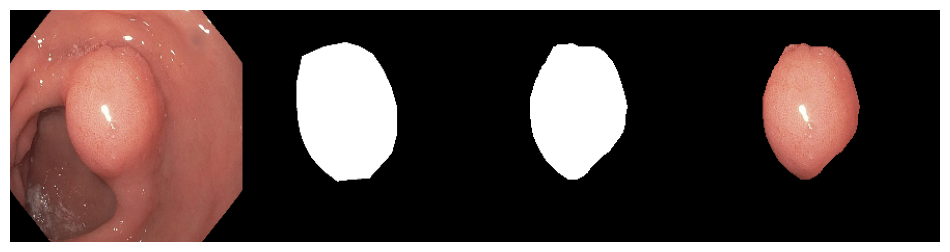

 Epoch: 66 of 100, Iter.: 75 of 75, Train Loss: 0.030978, IoU: 0.960958, Dice: 0.979672
 Epoch: 66 of 100, Iter.: 75 of 75, Valid Loss: 0.587306, IoU: 0.706817, Dice: 0.794783


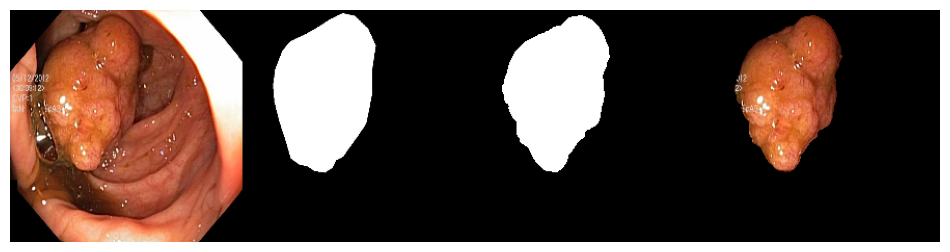

 Epoch: 67 of 100, Iter.: 75 of 75, Train Loss: 0.028736, IoU: 0.963286, Dice: 0.981021
 Epoch: 67 of 100, Iter.: 75 of 75, Valid Loss: 0.600867, IoU: 0.703987, Dice: 0.792705


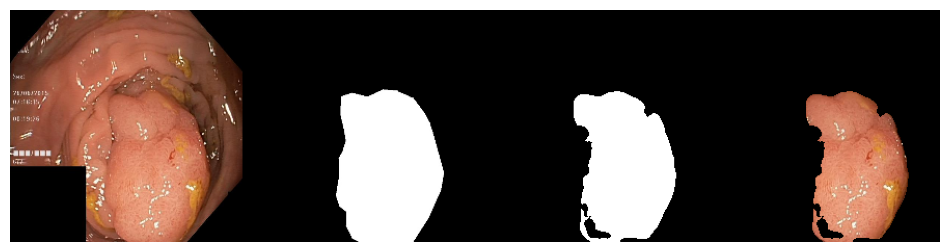

 Epoch: 68 of 100, Iter.: 75 of 75, Train Loss: 0.029003, IoU: 0.963424, Dice: 0.980942
 Epoch: 68 of 100, Iter.: 75 of 75, Valid Loss: 0.578178, IoU: 0.707897, Dice: 0.796394


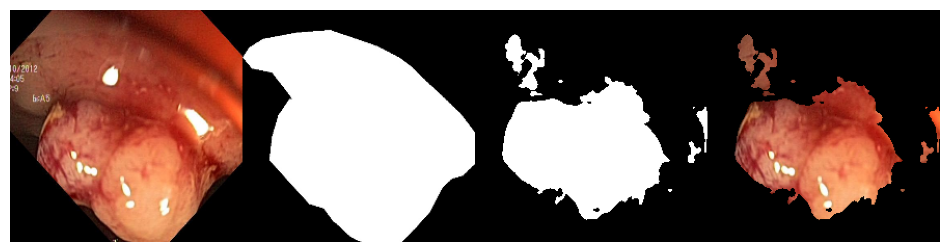

 Epoch: 69 of 100, Iter.: 75 of 75, Train Loss: 0.029345, IoU: 0.962121, Dice: 0.980371
 Epoch: 69 of 100, Iter.: 75 of 75, Valid Loss: 0.620324, IoU: 0.691759, Dice: 0.780168


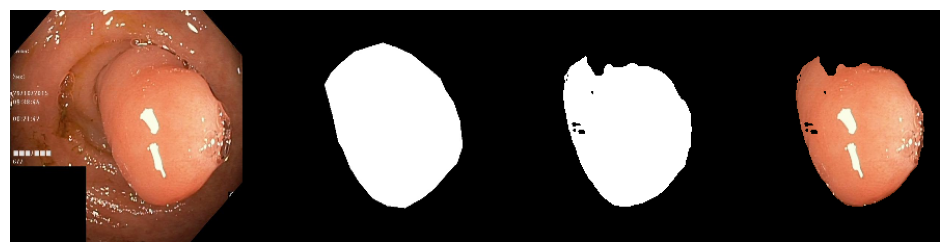

 Epoch: 70 of 100, Iter.: 75 of 75, Train Loss: 0.028675, IoU: 0.963302, Dice: 0.981010
 Epoch: 70 of 100, Iter.: 75 of 75, Valid Loss: 0.650290, IoU: 0.678739, Dice: 0.768179


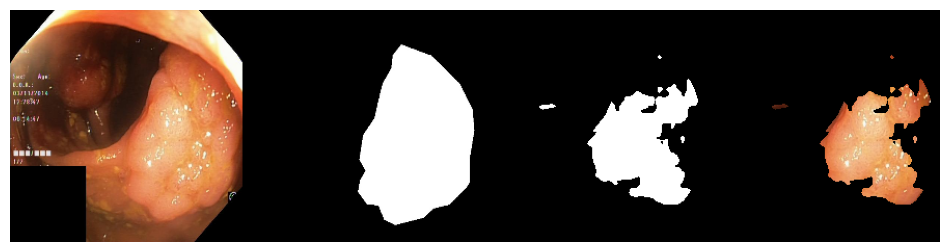

 Epoch: 71 of 100, Iter.: 75 of 75, Train Loss: 0.031781, IoU: 0.960128, Dice: 0.979297
 Epoch: 71 of 100, Iter.: 75 of 75, Valid Loss: 0.737264, IoU: 0.632532, Dice: 0.735854


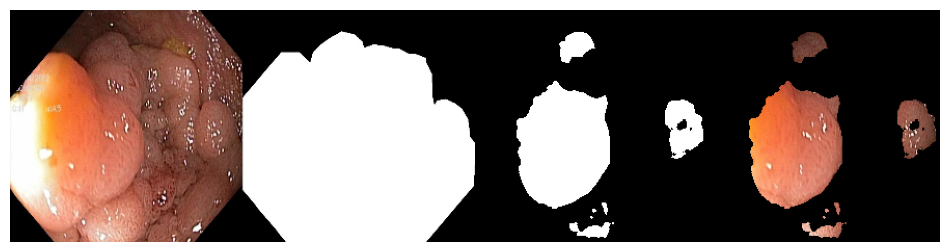

 Epoch: 72 of 100, Iter.: 75 of 75, Train Loss: 0.099312, IoU: 0.897288, Dice: 0.937342
 Epoch: 72 of 100, Iter.: 75 of 75, Valid Loss: 0.696776, IoU: 0.589326, Dice: 0.708842


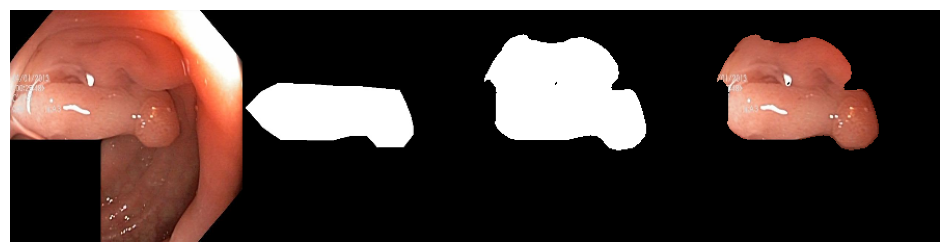

 Epoch: 73 of 100, Iter.: 75 of 75, Train Loss: 0.151972, IoU: 0.854220, Dice: 0.911095
 Epoch: 73 of 100, Iter.: 75 of 75, Valid Loss: 0.575406, IoU: 0.644547, Dice: 0.742581


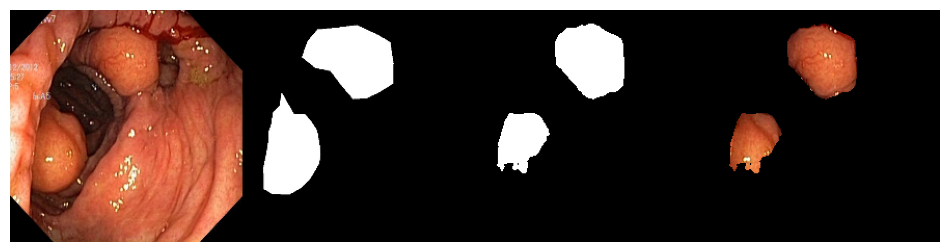

 Epoch: 74 of 100, Iter.: 75 of 75, Train Loss: 0.109830, IoU: 0.881732, Dice: 0.928965
 Epoch: 74 of 100, Iter.: 75 of 75, Valid Loss: 0.625766, IoU: 0.652180, Dice: 0.752081


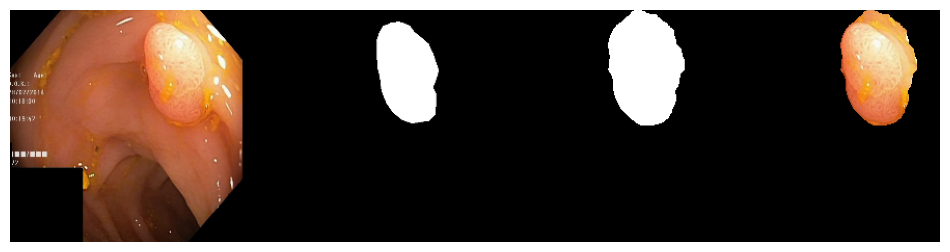

 Epoch: 75 of 100, Iter.: 75 of 75, Train Loss: 0.080061, IoU: 0.908475, Dice: 0.947865
 Epoch: 75 of 100, Iter.: 75 of 75, Valid Loss: 0.564087, IoU: 0.680725, Dice: 0.782504


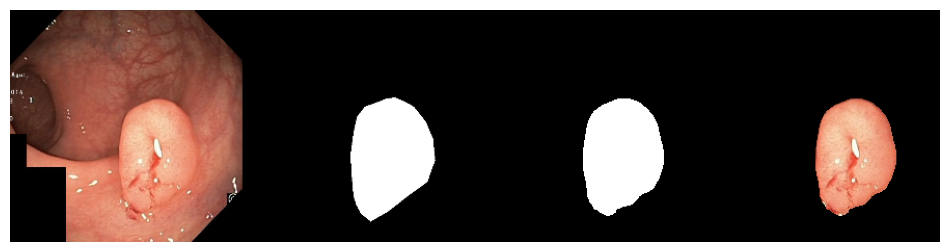

 Epoch: 76 of 100, Iter.: 75 of 75, Train Loss: 0.053390, IoU: 0.935573, Dice: 0.965211
 Epoch: 76 of 100, Iter.: 75 of 75, Valid Loss: 0.560019, IoU: 0.706210, Dice: 0.799439


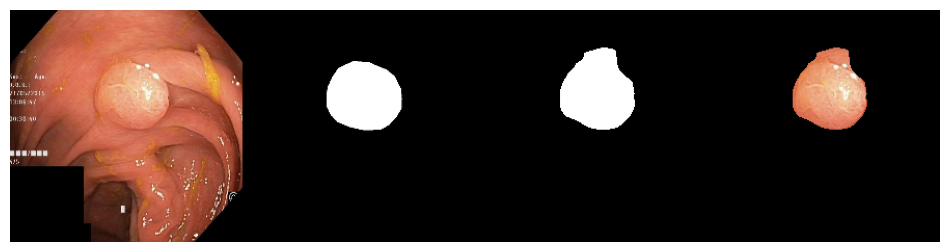

 Epoch: 77 of 100, Iter.: 75 of 75, Train Loss: 0.041883, IoU: 0.946368, Dice: 0.971609
 Epoch: 77 of 100, Iter.: 75 of 75, Valid Loss: 0.604976, IoU: 0.698094, Dice: 0.785867


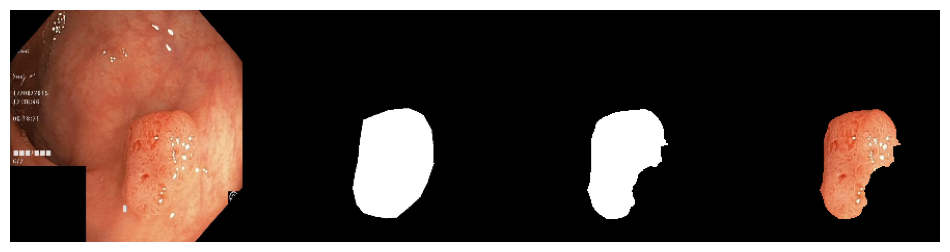

 Epoch: 78 of 100, Iter.: 75 of 75, Train Loss: 0.032870, IoU: 0.957505, Dice: 0.978020
 Epoch: 78 of 100, Iter.: 75 of 75, Valid Loss: 0.616610, IoU: 0.700627, Dice: 0.788032


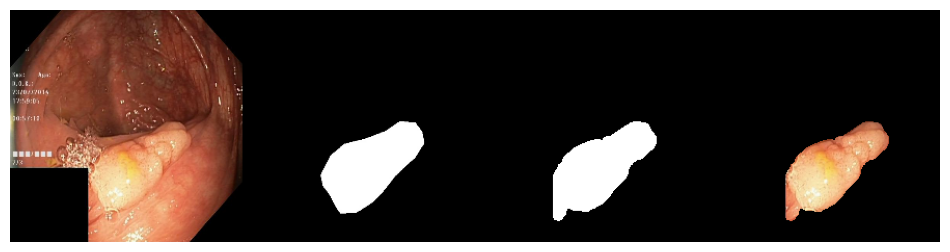

 Epoch: 79 of 100, Iter.: 75 of 75, Train Loss: 0.029622, IoU: 0.960930, Dice: 0.979651
 Epoch: 79 of 100, Iter.: 75 of 75, Valid Loss: 0.611612, IoU: 0.702343, Dice: 0.790368


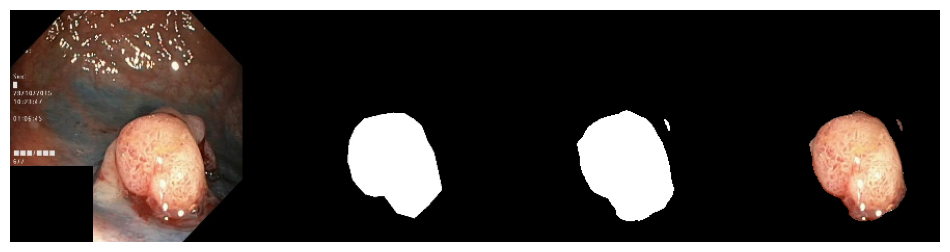

 Epoch: 80 of 100, Iter.: 75 of 75, Train Loss: 0.028105, IoU: 0.963062, Dice: 0.980926
 Epoch: 80 of 100, Iter.: 75 of 75, Valid Loss: 0.608360, IoU: 0.707240, Dice: 0.795691


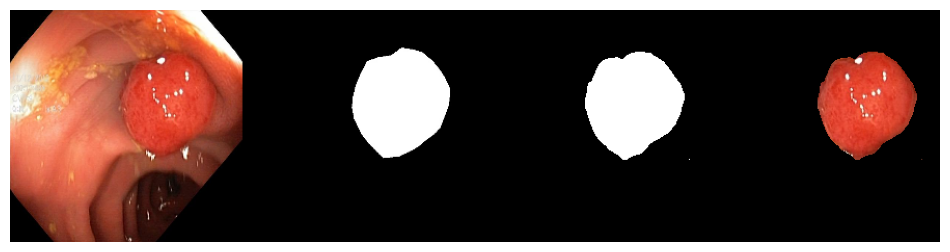

 Epoch: 81 of 100, Iter.: 75 of 75, Train Loss: 0.026127, IoU: 0.965643, Dice: 0.982342
 Epoch: 81 of 100, Iter.: 75 of 75, Valid Loss: 0.624197, IoU: 0.701365, Dice: 0.790575


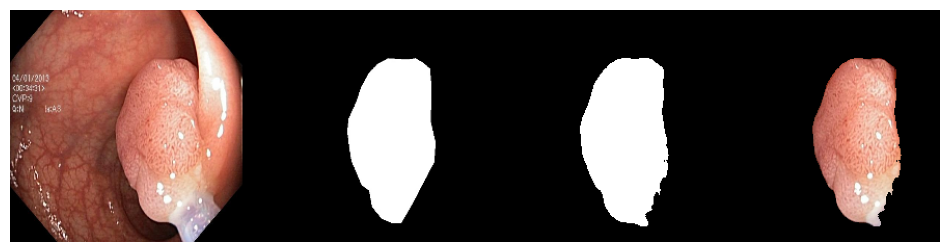

 Epoch: 82 of 100, Iter.: 75 of 75, Train Loss: 0.025631, IoU: 0.966554, Dice: 0.982696
 Epoch: 82 of 100, Iter.: 75 of 75, Valid Loss: 0.614500, IoU: 0.710794, Dice: 0.799457


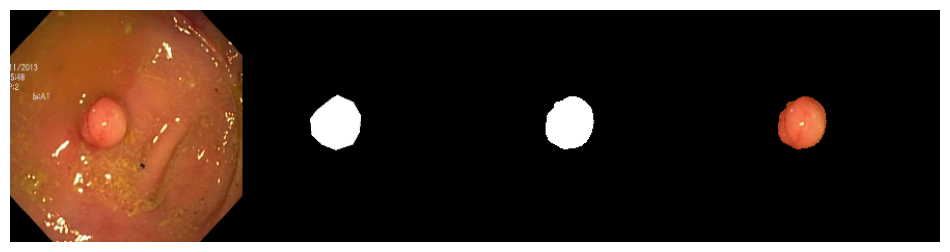

 Epoch: 83 of 100, Iter.: 75 of 75, Train Loss: 0.024096, IoU: 0.968532, Dice: 0.983851
 Epoch: 83 of 100, Iter.: 75 of 75, Valid Loss: 0.630006, IoU: 0.701644, Dice: 0.792466


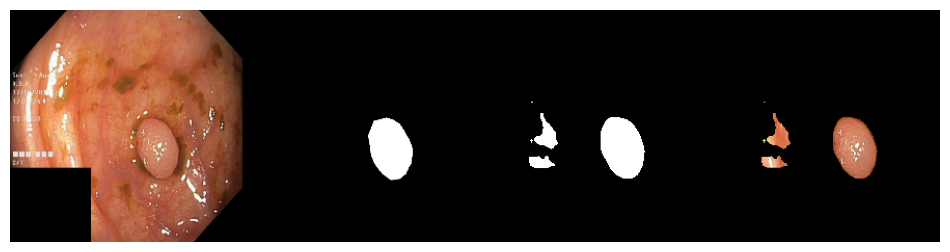

 Epoch: 84 of 100, Iter.: 75 of 75, Train Loss: 0.023604, IoU: 0.969171, Dice: 0.984186
 Epoch: 84 of 100, Iter.: 75 of 75, Valid Loss: 0.623054, IoU: 0.708829, Dice: 0.797928


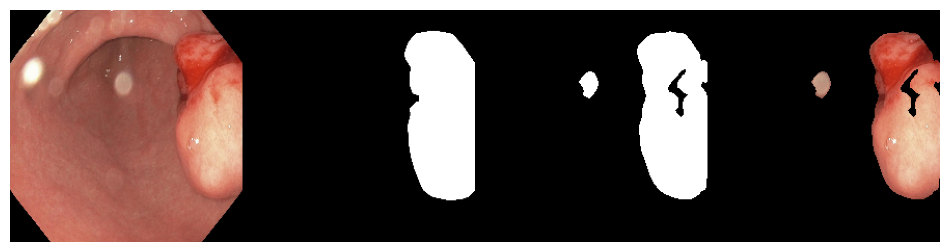

 Epoch: 85 of 100, Iter.: 75 of 75, Train Loss: 0.023552, IoU: 0.969063, Dice: 0.984090
 Epoch: 85 of 100, Iter.: 75 of 75, Valid Loss: 0.630594, IoU: 0.705169, Dice: 0.795670


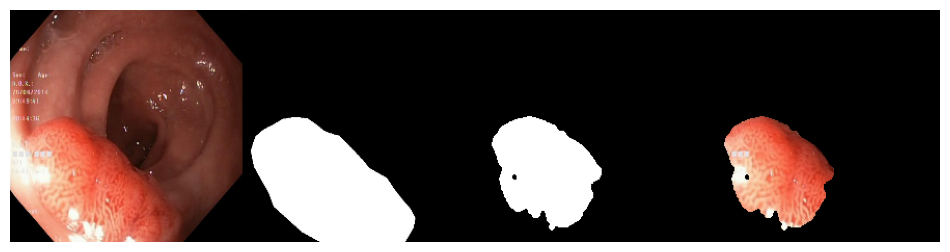

 Epoch: 86 of 100, Iter.: 75 of 75, Train Loss: 0.022466, IoU: 0.970061, Dice: 0.984627
 Epoch: 86 of 100, Iter.: 75 of 75, Valid Loss: 0.641203, IoU: 0.704081, Dice: 0.794647


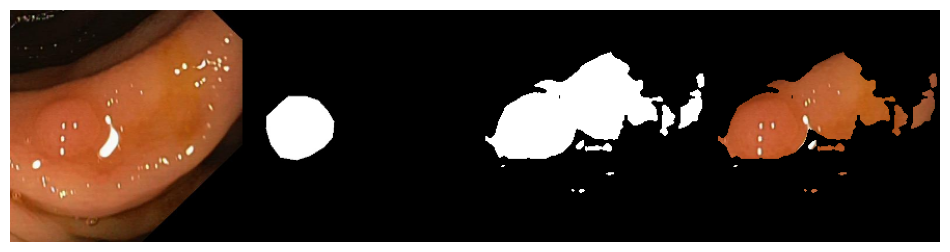

 Epoch: 87 of 100, Iter.: 65 of 75, Loss: 0.021580, IoU:  0.971185,  Dice:  0.985229

[ WARN:0@1639.265] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/image_891.jpg'): can't open/read file: check file path/integrity


 Epoch: 87 of 100, Iter.: 67 of 75, Loss: 0.021630, IoU:  0.971207,  Dice:  0.985243

[ WARN:0@1639.485] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/image_845.jpg'): can't open/read file: check file path/integrity
[ WARN:0@1639.595] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/image_464.jpg'): can't open/read file: check file path/integrity


 Epoch: 87 of 100, Iter.: 69 of 75, Loss: 0.021548, IoU:  0.971448,  Dice:  0.985371

[ WARN:0@1639.705] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/image_847.jpg'): can't open/read file: check file path/integrity
[ WARN:0@1639.813] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/data/segmentation/segmentation/Kvasir-SEG/trainset/images/image_57.jpg'): can't open/read file: check file path/integrity


error: Caught error in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/smcho1201/.conda/envs/pytorch/lib/python3.9/site-packages/torch/utils/data/_utils/worker.py", line 287, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/smcho1201/.conda/envs/pytorch/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 49, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/smcho1201/.conda/envs/pytorch/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 49, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/project/segmentation/smcho1201/segmentation_project/utils/dataset.py", line 39, in __getitem__
    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)  # cv2는 채널이 BGR로 저장된다 -> 출력할 때 RGB로 바꿔줘야함
cv2.error: OpenCV(4.6.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'



In [11]:

%%time
from ploting import plot_model_prediction

train_losses, val_losses = [], []
train_ious, val_ious = [], []
train_dices, val_dices = [], []
best_iou, best_dice, best_loss = 0, 0, np.inf
best_epoch_dice = -1
state = {}
lst_epoch_metric = []

start_time = time.time()
for epoch in range(1, epochs+1):
    running_loss, running_iou, running_dice = 0, 0, 0

    # Train
    model.train()
    for i, (imgs, masks) in enumerate(dataloader_train):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        
        optimizer.zero_grad()
        loss = criterion(prediction, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_iou += iou_pytorch_eval(prediction, masks)
        running_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, IoU:  {:.6f},  Dice:  {:.6f}".format(epoch, epochs, i, len(dataloader_train), running_loss/(i+1), running_iou/(i+1), running_dice/(i+1)), end="")
        
    # Validate
    model.eval()
    val_loss, val_iou, val_dice = 0, 0, 0
    for i, (imgs, masks) in enumerate(dataloader_val):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        loss = criterion(prediction, masks)
        val_loss += loss.item()
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, Val. Loss: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_loss/len(dataloader_train), val_loss/(i+1)), end="")
        
        val_iou += iou_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, IoU: {:.6f}, Val. IoU: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_iou/len(dataloader_train), val_iou/(i+1)), end="")

        val_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Dice: {:.6f}, Val. Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_dice/len(dataloader_train), val_dice/(i+1)), end="")
    
    
    # compute overall epoch losses
    epoch_train_loss = running_loss/len(dataloader_train)
    train_losses.append(epoch_train_loss)
    epoch_val_loss = val_loss/len(dataloader_val)
    val_losses.append(epoch_val_loss)

    # compute overall epoch iou-s
    epoch_train_iou = (running_iou/len(dataloader_train)).item()
    train_ious.append(epoch_train_iou)
    epoch_val_iou = (val_iou/len(dataloader_val)).item()
    val_ious.append(epoch_val_iou)
    
    # compute overall epoch dice
    epoch_train_dice = (running_dice/len(dataloader_train)).item()
    train_dices.append(epoch_train_dice)
    epoch_val_dice = (val_dice/len(dataloader_val)).item()
    val_dices.append(epoch_val_dice)

    print("\r Epoch: {} of {}, Iter.: {} of {}, Train Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_train_loss, epoch_train_iou, epoch_train_dice))
    print("\r Epoch: {} of {}, Iter.: {} of {}, Valid Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_val_loss, epoch_val_iou, epoch_val_dice))
    if epoch == 1:
        print('\n시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.')
    plot_model_prediction(model, DEVICE, valid_images, valid_labels)
        
    # plot
    metrics = {'loss':[train_losses, epoch_train_loss, val_losses, epoch_val_loss],
               'Iou':[train_ious, epoch_train_iou, val_ious,  epoch_val_iou],
               'Dice':[train_dices, epoch_train_dice, val_dices,  epoch_val_dice]}
    
    lst_epoch_metric.append([round(epoch_train_loss,4), round(epoch_train_iou,4), round(epoch_train_dice,4), 
                             round(epoch_val_loss,4), round(epoch_val_iou,4), round(epoch_val_dice,4)]) 

    # save if best results or break is has not improved for {patience} number of epochs
    best_iou = max(best_iou, epoch_val_iou)
    best_dice = max(best_dice, epoch_val_dice)
    best_loss = min(best_loss, epoch_val_loss)
    best_epoch_dice = epoch if best_dice == epoch_val_dice else best_epoch_dice

    # record losses
    state['train_losses'] = train_losses
    state['val_losses'] = val_losses
    
    if best_epoch_dice == epoch:
        # print('Saving..')
        state['net'] = model.state_dict()
        state['dice'] = best_dice
        state['epoch'] = epoch
            
        if not os.path.isdir('checkpoints'):
            os.mkdir('checkpoints')
        torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
    
    
    elif best_epoch_dice + patience < epoch:
        print(f"\nEarly stopping. Target criteria has not improved for {patience} epochs.\n")
        break

file_name = f'{model_name}_{data_name}'
# load once more and write all the losses down (othw can miss the last 10)
end_time = time.time() - start_time

state = torch.load(f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
state['train_losses'] = train_losses
state['val_losses'] = val_losses
torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')

df_epoch_metric = pd.DataFrame(lst_epoch_metric, columns = ['epoch_train_loss', 'epoch_val_loss', 'epoch_train_iou', 'epoch_val_iou', 'epoch_train_dice', 'epoch_val_dice'])
df_epoch_metric.to_csv(f'/project/segmentation/smcho1201/training_{model_name}/csv_{file_name}.csv', index_label = ['epoch'])

Validationset 기준 
Best_epoch:82, Best_IOU:0.7108, Best_DiceScore:0.7995


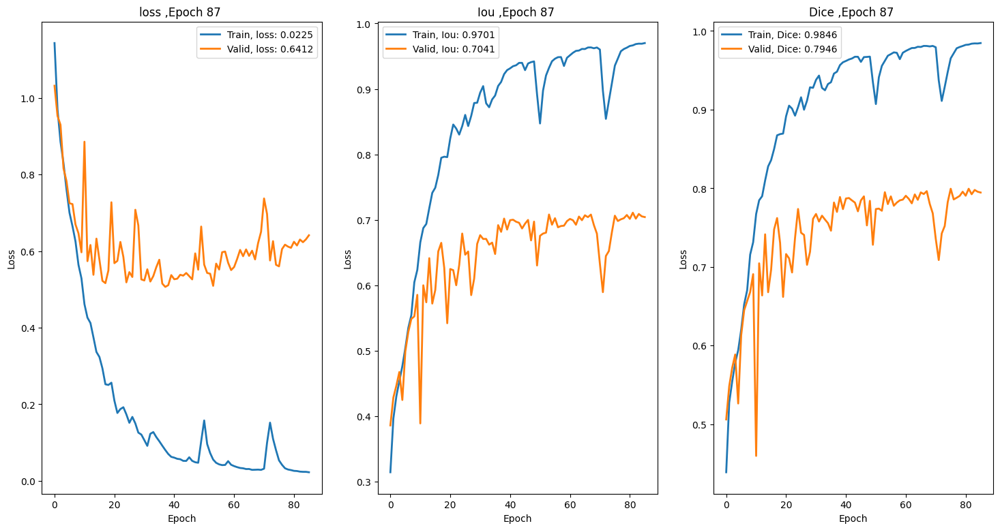

In [12]:
print(f'Validationset 기준 \nBest_epoch:{best_epoch_dice}, Best_IOU:{best_iou:.4f}, Best_DiceScore:{best_dice:.4f}')

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 9))           
for i, (metric, value) in enumerate(metrics.items()):
    axs[i].plot(np.arange(len(value[0])), value[0], label=f'Train, {metric}: {value[1]:.4f}', linewidth=2)
    axs[i].plot(np.arange(len(value[2])), value[2], label=f'Valid, {metric}: {value[3]:.4f}', linewidth=2)
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
    axs[i].set_title(f'{metric} ,Epoch {epoch} ')
    axs[i].legend(loc='best')
plt.show()